<!-- SVG logo in the top left -->
<img src="src/fxg_logo.png" width="100" height="50" style="margin-bottom: 1px;">

<h1> PI Planning Image Classification Workshop</h1>
<h2> Author: Joseph Waugh</h2>
<h2> Date: 04/11/2023</h2>

---
<b>Purpose:</b> <p>PI Planning Workshop to Show How to Build, Train, and Evaluate a Basic Image Classification Model</p>
<b>Goal:</b> <p>By the end of the session, participants should be able to understand core logic of image dataset building, image preprocessing, TensorFlow modelling via transfer learning, and image model evaluation 
<!-- Collapsible list of steps -->
<details>
  <summary>
      <strong>Steps:</strong>
  </summary>
  <ol>
      <li><a href="#Setup-Environment">Setup Environment</a></li>
      <li><a href="#Visualize-Dataset">Visualize Dataset</a></li>
      <li><a href="#Augmenting-the-Dataset">Augmenting the Dataset</a></li>
      <li><a href="#Building-a-Deep-Learning-Model">Building a Deep Learning Model</a></li>
      <li><a href="#Evaluating-the-Model-Performance">Training and evaluating the model</a></li>
    </ol>
</details>

<h2>Setup Environment</h2>
<b>Purpose:</b>
<br>
<ul>
    <li>Setup Python environment with required libraries</li>
    <li>Download CIFAR-10 Dataset</li>
</ul>
<hr>
<details>
    <summary>
        <strong>Additional Details</strong>
    </summary>
    <ul>
        <li>See the requirements.txt file in the src folder for the required dependencies needed to run this notebook</li>
    </ul>
</details>

<h4>Install Libraries</h4>
Import required libraries to run below code

In [ ]:
!pip install -r requirements.txt

<h4>Import Libraries</h4>

Let's start the workshop by importing various libraries, including a few custom functions defined in the utils.py file located in the utils folder. These will help us generate CIFAR-10 datasets, interpret the labels, and visualize data distributions by image class. Additional libraries are also imported for data processing and image transformations

In [1]:
import collections
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import tensorflow as tf
from tensorflow.keras import layers
from utils.utils import create_CIFAR_dataset, get_CIFAR_labels, visualize_dataset_counts, proba_classification_report

<h4 style="margin-bottom: -5px;">Download CIFAR-10 Dataset</h4><br>
Next, let's call the <b>create_CIFAR_dataset</b> function to import the CIFAR-10 dataset from a .tar.gz file location. We can then specify the creation of the train and test datasets, which will be partitioned into batches of 8. We can also use the custom function get_CIFAR_labels to parse the class labels into a usable format.
<hr>
<details>
    <summary>
        <strong>Additional Details</strong>
    </summary>
    <ul>
        <li><a href="https://www.cs.toronto.edu/~kriz/cifar.html"><b>CIFAR-10 Dataset Link: </b></a>
    <p>The CIFAR-10 dataset consists of 60,000 32x32 colour images 
        in 10 classes, with 6,000 images per class. There are 
        50,000 training images and 10,000 test images. The dataset 
        is divided into five training batches and one test batch, 
        each with 10,000 images. The test batch contains exactly 
        1,000 randomly-selected images from each class. The training
        batches contain the remaining images in random order, but 
        some training batches may contain more images from one class 
        than another. Between them, the training batches contain 
        exactly 5,000 images from each class.
    <br><br>
        This code uses the create_CIFAR_dataset to download a .tar.gz
        file containing the CIFAR-10 dataset, and parses it into a
        TensorFlow Dataset object to be used for EDA, training, and
        inference testing. The get_CIFAR_labels function similarly 
        parses the outputs of the downloaded .tar.gz file (it must be 
        called after create_CIFAR_dataset), and creates a dictionary
        to map the labels for the dataset objects into the original 
        CIFAR-10 labels (i.e., 0 = airplane, 1 = automobile, etc.)</li>
        <li><b>How do we set the BATCH_SIZE parameter?</b> The BATCH_SIZE parameter can affect the model training process in several ways:
            <ul>
                <li><b>Memory Usage:</b> Larger batch sizes require more memory to store the activations and gradients for each layer in the neural network. This can become a limiting factor, especially for models with a large number of layers.</li>
                <li><b>Training Time:</b> Batch size affects the speed of training. A smaller batch size means that the model updates its weights more frequently, which can result in faster convergence, but it also means that the training process will take longer overall.</li>
                <li><b>Generalization:</b> The batch size can have an impact on the generalization of the model. Smaller batch sizes can lead to better generalization, as the model is exposed to a more diverse set of samples in each iteration. However, this can also make the training process more noisy, leading to a slower convergence rate.</li>
            </ul>

</li>
    </ul>
</details>


In [2]:
# Create CIFAR-10 Dataset (size: 162 MB)
CIFAR_10_PATH = 'https://www.cs.toronto.edu/~kriz/cifar-10-python.tar.gz'
LOCAL_PATH = 'data'
BATCH_SIZE = 16

train_dataset = create_CIFAR_dataset(CIFAR_10_PATH, LOCAL_PATH, split='train').batch(BATCH_SIZE)
validation_dataset = create_CIFAR_dataset(CIFAR_10_PATH, LOCAL_PATH, split='validation').batch(BATCH_SIZE)
test_dataset = create_CIFAR_dataset(CIFAR_10_PATH, LOCAL_PATH, split='test').batch(BATCH_SIZE)
class_dict = get_CIFAR_labels()

2023-04-11 13:26:59.461575: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-04-11 13:26:59.472731: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-04-11 13:26:59.474395: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-04-11 13:26:59.476856: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

<h4>What do our class labels mean?</h4>
This class_dict variable indicates the text label that corresponds with each integer label associated with the images in the train and test datasets 

In [3]:
for class_name, class_value in class_dict.items():
    print(f'Class {class_name}: {class_value}') 


Class 0: airplane
Class 1: automobile
Class 2: bird
Class 3: cat
Class 4: deer
Class 5: dog
Class 6: frog
Class 7: horse
Class 8: ship
Class 9: truck


<h2>Visualize Dataset</h2>
Next, let's show some sample images from our training TensorFlow.Dataset object. This will give us a sense of the 
image quality (resolution, cropped subject matter, etc.), and what the images look like that belong to each class. Then, let's determine the distribution of images that belong to each dataset
<br>
<br>
<b>Purpose:</b>
<br>
<ul>
    <li>Show sample images from all classes</li>
    <li>Visualize dataset counts and class frequency</li>
</ul>

<h4>Show Sample Images from the Training Dataset</h4>
Next, let's go ahead and generate a grid of 64 sample images from our training dataset. Since we have the dataset batch size set to 8 images, we can call the .take(8) method to get $8*8 = 64$ images to use for our sample image grid. Then, we can utilize our class_dict to identify the correct class name based on the original class number
<br><br>
<details>
    <summary>
        <strong>Additional Details</strong>
    </summary>
    <ul>
        <li><b>Why Visualize the Dataset?</b><br> Visualizing a TensorFlow dataset of images before modeling is important 
        because it allows you to gain insights into the characteristics of the dataset and better understand the 
        nature of the images you will be working with. In particular, visualizing images can help identify issues with 
        the quality of the data, such as blurry or mislabeled images, and can also reveal patterns or trends in the 
        data that may be relevant to the modeling task. Since the images in CIFAR-10 are relatively small 
        (32x32 pixels), visualizing them can help you identify any challenges associated with the low resolution of 
        the images, such as difficulty in distinguishing between similar objects or in detecting fine-grained details.
        Understanding these challenges can help inform the selection of appropriate modeling techniques and 
        preprocessing steps to improve performance on the dataset.
        <br><br>
        For the CIFAR-10 dataset specifically, visualizing the images can provide important context about the types 
        of objects and scenes that are present in the dataset. Additionally, because the images in CIFAR-10 are 
        relatively small (32x32 pixels), visualizing them can help you identify any challenges associated with the
        low resolution of the images, such as difficulty in distinguishing between similar objects or in detecting 
        fine-grained details. Understanding these challenges can help inform the selection of appropriate modeling 
        techniques and preprocessing steps to improve performance on the dataset.
        </li>
    </ul>
</details>
    


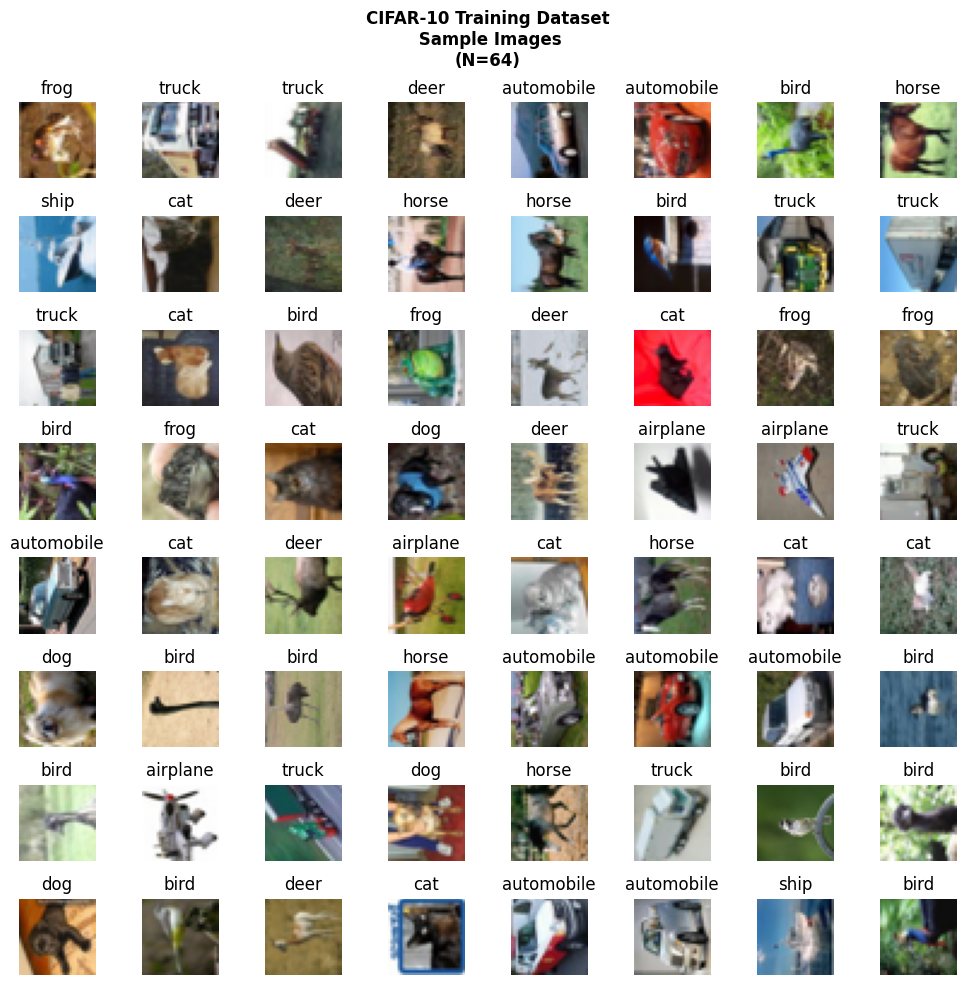

In [4]:
sample_imgs = np.concatenate([im.numpy() for im, label in train_dataset.take(8)])
sample_labels = np.concatenate([label for im, label in train_dataset.take(8)])

fig, axs = plt.subplots(nrows = 8, ncols = 8, figsize=(10,10))
for i, ax in enumerate(axs.flat):
    ax.imshow(sample_imgs[i])
    ax.set_title(class_dict[sample_labels[i]])
    ax.axis('off')

plt.suptitle('CIFAR-10 Training Dataset\n Sample Images\n(N=64)', fontweight='bold')
fig.tight_layout()
plt.show()

<h4>Visualize Training Dataset Counts and Class Distribution</h4>
We can call the prebuilt visualize_dataset_counts function, using the train_dataset, class_dict (to link the raw (0-9) labels to class names), and a dataset name to visualize the counts and percent distribution of images belonging to each class. While we know this dataset is normally balanced, this is generally good practice to understand if any class imbalance exists.<br><br>
<b>Why is Class Imbalance Important</b>When class imbalance exists, this means the distribution of classes in the training data is not equal, with some classes being more prevalent than others. This can have several implications on the model's performance and results.
<ol>
    <li><b>Bias in Model Predictions: </b> A model trained on imbalanced data may be biased towards the majority class, as it has more examples to learn from. This can result in poor performance for minority classes. 

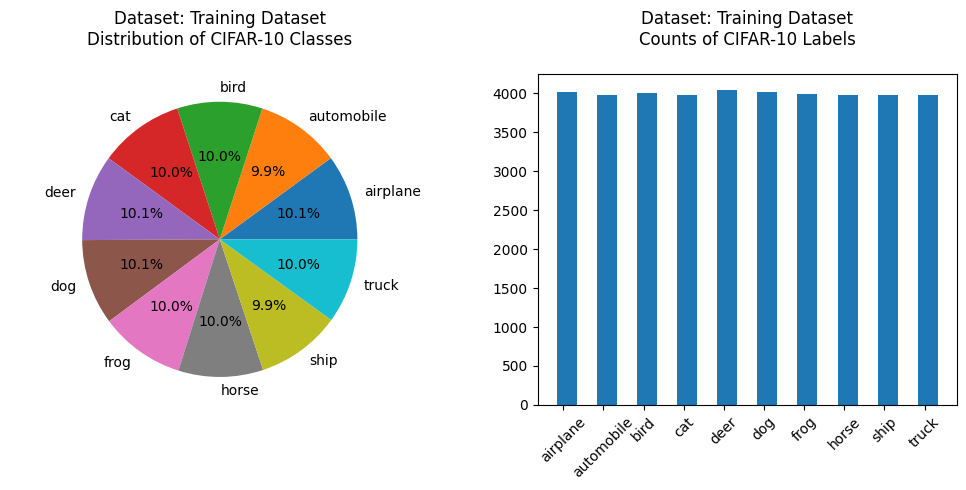

In [5]:
visualize_dataset_counts(train_dataset, class_dict, dataset_name = 'Training Dataset')

<h4>Visualize Test Dataset Counts and Class Distribution</h4>
We can call the prebuilt visualize_dataset_counts function, this time using the test_dataset. Similar to above, this dataset is also evenly distributed across all classes, but instead of 5,000 images per class, there's 1,000 images per class.

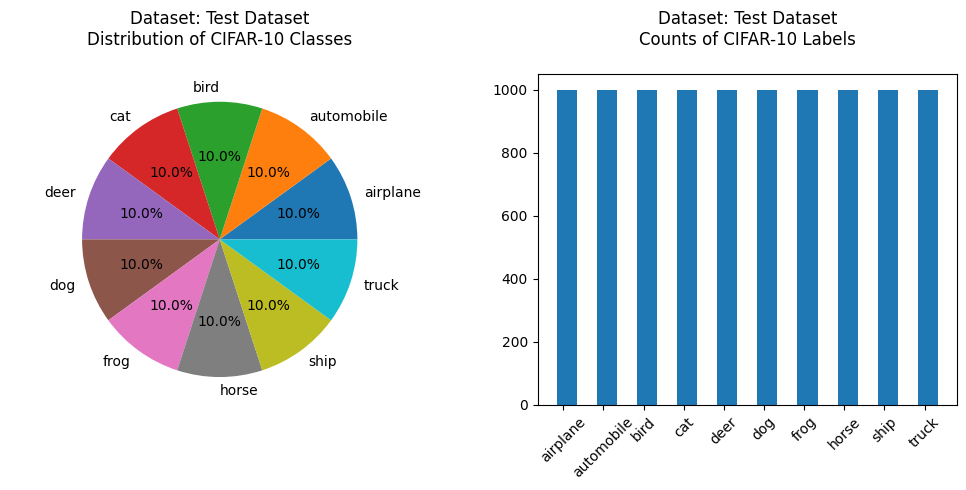

In [6]:
visualize_dataset_counts(test_dataset, class_dict, dataset_name = 'Test Dataset')

<h2>Augmenting the Dataset</h2>
<b>Purpose:</b> 
<p>Show different methods of data augmentation when compared to a single image</p>
<ul>
    <li>Bounding Box Cropping</li>
    <li>Edge Detection</li>
    <li>Random Brightness</li>
    <li>Random Crop</li>
    <li>Random Hue</li>
    <li>Random Rotation/Flip</li>
    <li>Random Saturation</li>
</ul>
<hr>
<details>
    <summary>
        <strong>Additional Details</strong>
    </summary>
    <ul>
        <li><b>Random Brightness:</b> The <a href="https://www.tensorflow.org/api_docs/python/tf/image/random_brightness">tf.image.random_brightness()</a> function is a powerful tool in image processing that
            randomly adjusts the brightness of an image. This function takes an input image and adds a random value 
            to each pixel's intensity to adjust its brightness. The magnitude of this adjustment is determined by the
            max_delta parameter, which specifies the maximum amount of brightness adjustment to apply. The
            tf.image.random_brightness function can be particularly useful in image classification problems, where 
            slight variations in image brightness can make a significant difference in the accuracy of the 
            classification model. For example, if a model is trained on images that are all taken under the same 
            lighting conditions, it may not perform well on images that have different lighting conditions. By using
            tf.image.random_brightness to randomly adjust the brightness of training images, the model can learn to 
            be more robust to variations in lighting conditions and perform better on new, unseen images.
        </li><br>
        <li><b>Random Cropping:</b> The <a href="https://www.tensorflow.org/api_docs/python/tf/image/random_crop">tf.image.random_crop()</a> function is a useful tool for data augmentation in image classification problems. It takes an input image and randomly crops a section of the image to a specified size. The random cropping can help to add variation to the training dataset and make the model more robust to differences in input images. In image classification tasks, random cropping can help to prevent overfitting and improve the generalization ability of the model. By randomly cropping sections of the image, the model is forced to learn more robust and flexible features that can better represent the underlying structure of the data.</li><br>
        <li><b>Random Hue:</b> The <a href="https://www.tensorflow.org/api_docs/python/tf/image/random_hue">tf.image.random_hue()</a> function takes an input image and randomly adjusts the hue channel of the image by a specified amount. Hue is one of the three color channels in an RGB image and controls the dominant color of the image. By randomly adjusting the hue of an image, the function can generate a wide range of color variations of the same image.By generating variations of the same image with different color tones, the model is forced to learn more robust and flexible features that can better represent the underlying structure of the data.</li><br>
        <li><b>Random Rotation/Flip:</b> The <a href="https://www.tensorflow.org/api_docs/python/tf/keras/layers/RandomFlip"> tf.keras.layers.RandomFlip()</a> and <a href="https://www.tensorflow.org/api_docs/python/tf/keras/layers/RandomRotation"> tf.keras.layers.RandomRotation()</a> layers take an input image and randomly flip & rotate an image by a specified amount. By applying random flips and rotations to the images, the model can learn to recognize the object regardless of its orientation or position within the image. This can also help prevent overfitting, as the model is trained on a larger and more diverse set of data.</li><br>
        <li><b>Random Saturation: </b> The <a href=""https://www.tensorflow.org/api_docs/python/tf/image/random_saturation>tf.image.random_saturation()</a> function is used for random color saturation augmentation in image data. It randomly adjusts the saturation level of the input image within a specified range. By adding random saturation to an image, we can increase the diversity of the dataset, which can improve the performance of the trained model by reducing overfitting.</li>
</details>

<h4>Unmodified Image</h4>
Let's start by importing an image of a Ford GT40. Then let's plot the image without any modifications to the original image

(-0.5, 1280.5, 960.5, -0.5)

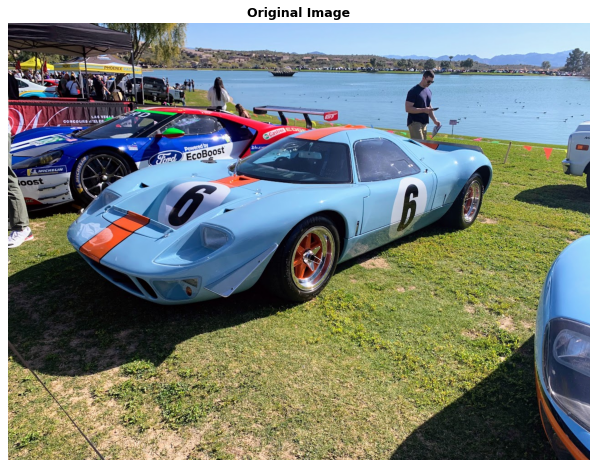

In [7]:
image = Image.open('src/car_image.jpg')
batch_image = tf.expand_dims(np.asarray(image), axis=0)
plt.figure(figsize=(10, 10), dpi=75)
plt.imshow(image)
plt.title(f'Original Image', fontweight='bold')
plt.axis('off')

<h4>Application of Bounding Boxes</h4>
Let's try exploring some image modifications via bounding boxes. Cropping images is important in the context of image classification as it allows the model to focus on relevant regions of an image, removing unnecessary background or irrelevant portions. This can help to eliminate noise, reduce computational overhead, and enable the model to better capture and learn important features or patterns in the images, leading to improved accuracy and performance in image classification tasks. We can explore this by calling the <b><a href="https://www.tensorflow.org/api_docs/python/tf/image/crop_to_bounding_box">tf.image.crop_to_bounding_box()</a></b> function and the <a href="https://www.tensorflow.org/api_docs/python/tf/image/draw_bounding_boxes">tf.image.draw_bounding_boxes()</a></b> functions. <br><br>
<table align="left">
    <thead>
        <tr>
            <th colspan="2" align="left">tf.image.crop_to_bounding_box</th>
        </tr>
        <tr>
            <th align='left'>Argument</th>
            <th align='left'>Definition</th>
        </tr>
    </thead>
    <tbody>
        <tr>
            <td>image</td>
            <td>4-D Tensor of shape [batch, height, width, channels] or 3-D Tensor of shape [height, width, channels].</td>
        </tr>
        <tr>
            <td>offset_height</td>
            <td>Vertical coordinate of the top-left corner of the bounding box in image.</td>
        </tr>
        <tr>
            <td>offset_width</td>
            <td>Horizontal coordinate of the top-left corner of the bounding box in image.</td>
        </tr>
        <tr>
            <td>target_height</td>
            <td>Height of the bounding box.</td>
        </tr>
        <tr>
            <td>target_width</td>
            <td>Width of the bounding box.</td>
        </tr>
    </tbody>
</table>
<table align="left">
    <thead>
        <tr>
            <th colspan="2" align="left">tf.image.draw_bounding_boxes</th>
        </tr>
        <tr>
            <th align='left'>Argument</th>
            <th align='left'>Definition</th>
        </tr>
    </thead>
    <tbody>
        <tr>
            <td>images</td>
            <td>A Tensor. Must be one of the following types: float32, half. 4-D with shape [batch, height, width, depth]. A batch of images.
A Tensor. Must be one of the following types: float32, half. 4-D with shape [batch, height, width, depth]. A batch of images.
</td>
        </tr>
        <tr>
            <td>boxes</td>
            <td>A Tensor of type float32. 3-D with shape [batch,num_bounding_boxes, 4] containing bounding boxes.</td>
        </tr>
        <tr>
            <td>colors</td>
            <td>A Tensor of type float32. 2-D. A list of RGBA colors to cycle through for the boxes.</td>
        </tr>
    </tbody>
</table>


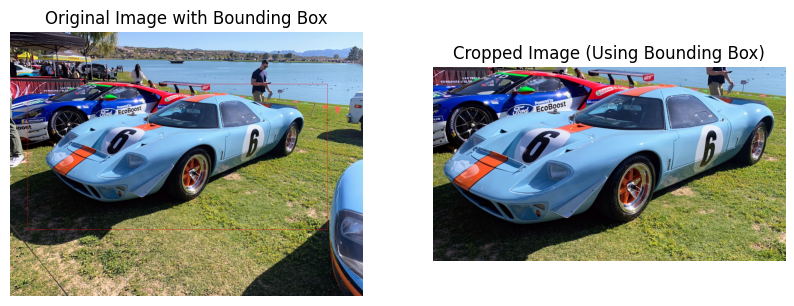

In [8]:
# create an empty image
img = tf.cast(np.asarray(batch_image), dtype=tf.float32)
# draw a box around the image
boxes = tf.constant([[[0.2, 0.05, 0.75, 0.9]]])
colors = np.array([[255.0, 0.0, 0.0]])

bbox_result = tf.image.draw_bounding_boxes(img, boxes, colors)
cropped_result = tf.image.crop_to_bounding_box(img, 175, 100, 550, 1000)

# Specify figsize for the figure
fig = plt.figure(figsize=(10, 5))


# Display the original and cropped images
plt.subplot(1, 2, 1)
plt.imshow(bbox_result[0].numpy().astype(np.uint8))
plt.title('Original Image with Bounding Box')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cropped_result[0].numpy().astype(np.uint8))
plt.title('Cropped Image (Using Bounding Box)')
plt.axis('off')

plt.show()

<h4>Application of Edge Detection</h4>
Next, let's explore the area of edge detection. Edge detection refers to the process of identifying and highlighting the boundaries or transitions between different regions or objects in an image. Edge detection works well in extracting relevant features and contextual cues from images that can aid in accurate and robust image analysis. Edge detection in TensorFlow typically involves convolving an image with a filter or kernel that is designed to highlight areas of rapid changes in pixel intensity, such as edges or boundaries. TensorFlow provides functions for applying convolution operations on images, which can be used to implement various edge detection algorithms, such as Sobel, Prewitt, Canny, etc.<br><br>
Sobel edge detection is a popular technique used in image processing to detect edges or boundaries in an image. It involves convolving an image with a small filter or kernel, typically of size 3x3 or 5x5, that calculates the gradient of intensity changes in the horizontal and vertical directions. The Sobel filter computes the gradient of intensity changes at each pixel, and the magnitude of the gradient is used to identify regions of rapid intensity changes, which correspond to edges or boundaries in the image. Sobel edge detection is simple and computationally efficient, making it widely used in various computer vision tasks, such as image segmentation, object detection, and image feature extraction. We can explore this by calling <a href="https://www.tensorflow.org/api_docs/python/tf/image/sobel_edges"><b>tf.image.sobel_edge()</b></a>:
<table align="left">
    <thead>
        <tr>
            <th colspan="2" align="left">tf.image.sobel_edge()</th>
        </tr>
        <tr>
            <th align='left'>Argument</th>
            <th align='left'>Definition</th>
        </tr>
    </thead>
    <tbody>
        <tr>
            <td>image</td>
            <td>Image tensor with shape [batch_size, h, w, d] and type float32 or float64. The image(s) must be 2x2 or larger.</td>
        </tr>
    </tbody>
</table>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


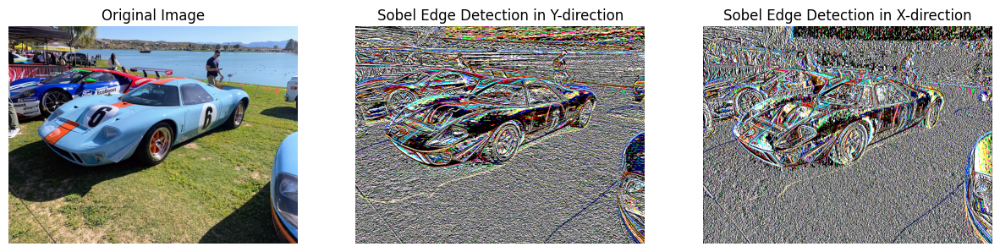

In [31]:
img = tf.cast(np.asarray(batch_image), dtype=tf.float32)
sobel = tf.image.sobel_edges(img)
sobel_y = np.asarray(sobel[0, :, :, :, 0]) # sobel in y-direction
sobel_x = np.asarray(sobel[0, :, :, :, 1]) # sobel in x-direction

# Create a 1x3 subplot layout
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 15))

# Display the original and cropped images
plt.subplot(1, 3, 1)
axes[0].imshow(np.asarray(img[0]).astype(np.uint8))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(np.asarray(sobel_y))
axes[1].set_title('Sobel Edge Detection in Y-direction')
axes[1].axis('off')

axes[2].imshow(np.asarray(sobel_x))
axes[2].set_title('Sobel Edge Detection in X-direction')
axes[2].axis('off')

plt.show()

<h4>Modifying the Image Brightness</h4>
Next, let's try modifying the brightness of the car image by calling the <b><a href="https://www.tensorflow.org/api_docs/python/tf/image/random_brightness">tf.image.random_brightness()</a></b> function. This function takes in the following arguments:
<table align="left">
    <thead>
        <tr>
            <th colspan="2" align="left">tf.image.random_brightness</th>
        </tr>
        <tr>
            <th align='left'>Argument</th>
            <th align='left'>Definition</th>
        </tr>
    </thead>
    <tbody>
        <tr>
            <td>image</td>
            <td>An image or images to adjust</td>
        </tr>
        <tr>
            <td>max_delta</td>
            <td>The maximum amount of brightness adjustment to apply to an image. Must be a float in the range [0, 1]. If <b>max_delta</b> is 0, the brightness does not change</td>
        </tr>
        <tr>
            <td>seed</td>
            <td>An integer used for reproducibility in how the image random_brightness is applied</td>
        </tr>
    </tbody>
</table>


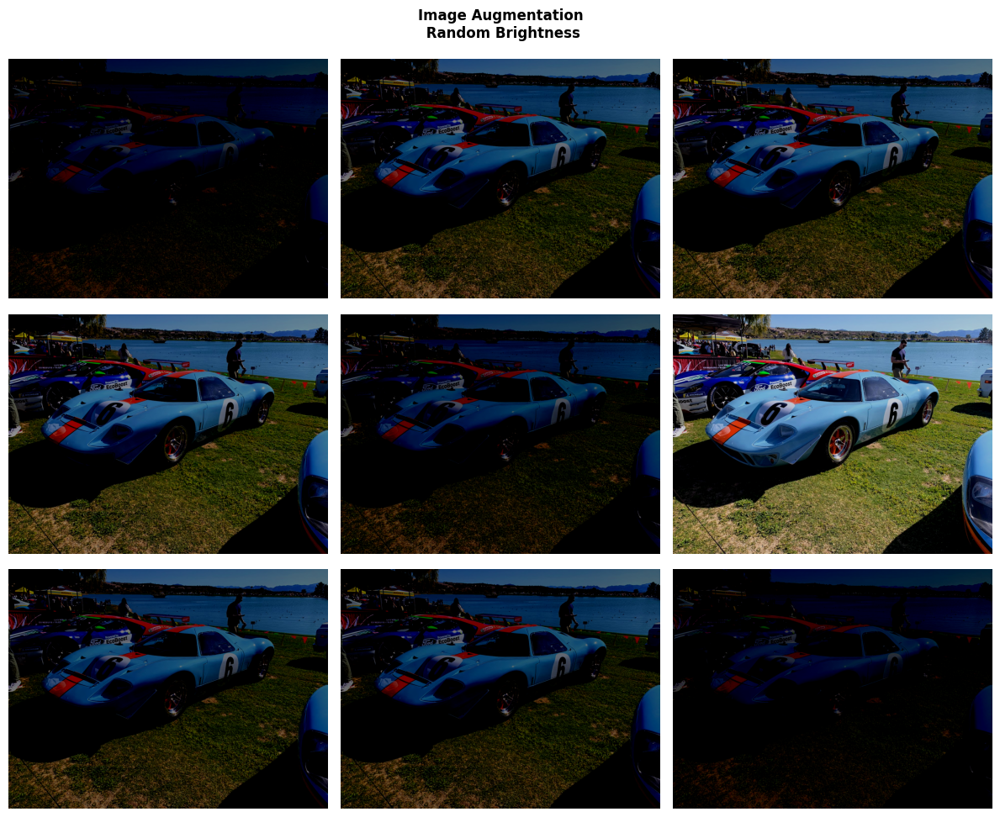

In [12]:
fig, axs = plt.subplots(nrows = 3, ncols = 3, figsize=(12,10))
for i, ax in enumerate(axs.flat):    
    augmented_img = tf.image.random_brightness(image=batch_image[0], max_delta=0.8, seed=None).numpy()
    ax.imshow(augmented_img.astype('uint8'))
    ax.axis('off')

plt.suptitle('Image Augmentation\n Random Brightness', fontweight='bold')
fig.tight_layout()
plt.show()

<h4>Cropping the Image</h4>
Next, let's try randomly cropping the image by calling the <b><a href="https://www.tensorflow.org/api_docs/python/tf/image/random_brightness">tf.image.random_crop()</a></b> function. This function takes in the following arguments:

<table align="left">
    <thead>
        <tr>
            <th colspan="2" align="left">tf.image.random_crop()</th>
        </tr>
        <tr>
            <th align='left'>Argument</th>
            <th align='left'>Definition</th>
        </tr>
    </thead>
    <tbody>
        <tr>
            <td>value</td>
            <td>Input tensor to crop</td>
        </tr>
        <tr>
            <td>size</td>
            <td>The new size of the cropped image (i.e., if cropping a 100x100x3 RGB image, setting the new size to (50,50,3) will randomly take a 50x50x3 crop of the original image)</td>
        </tr>
        <tr>
            <td>seed</td>
            <td>An integer used for reproducibility in how the image random_brightness is applied</td>
        </tr>
    </tbody>
</table>


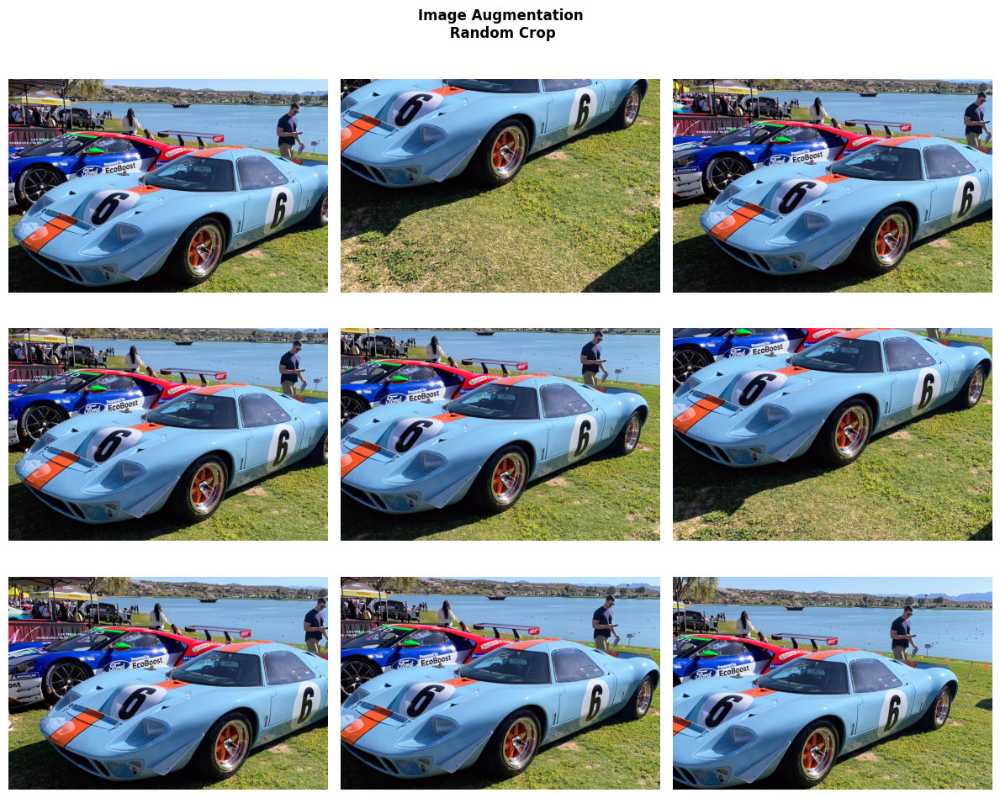

In [13]:
fig, axs = plt.subplots(nrows = 3, ncols = 3, figsize=(12,10))
for i, ax in enumerate(axs.flat):    
    augmented_img = tf.image.random_crop(value=batch_image[0], size=(600, 900, 3), seed=None).numpy()
    ax.imshow(augmented_img.astype('uint8'))
    ax.axis('off')

plt.suptitle('Image Augmentation\n Random Crop', fontweight='bold')
fig.tight_layout()
plt.show()

<h4>Adjusting the Hue</h4>
Next, let's try randomly adjusting the hue of the image by calling the <b><a href="https://www.tensorflow.org/api_docs/python/tf/image/random_hue">tf.image.random_hue()</a></b> function. This function takes in the following arguments:
<br>
<table align="left">
    <thead>
        <tr>
            <th colspan="2" align="left">tf.image.random_hue()</th>
        </tr>
        <tr>
            <th align='left'>Argument</th>
            <th align='left'>Definition</th>
        </tr>
    </thead>
    <tbody>
        <tr>
            <td>image</td>
            <td>RGB image or images. The size of the last dimension must be 3.</td>
        </tr>
        <tr>
            <td>max_delta</td>
            <td>A floating point number representing the maximum value for the random delta.</td>
        </tr>
        <tr>
            <td>seed</td>
            <td>An integer used for reproducibility in how the image random_brightness is applied</td>
        </tr>
    </tbody>
</table>


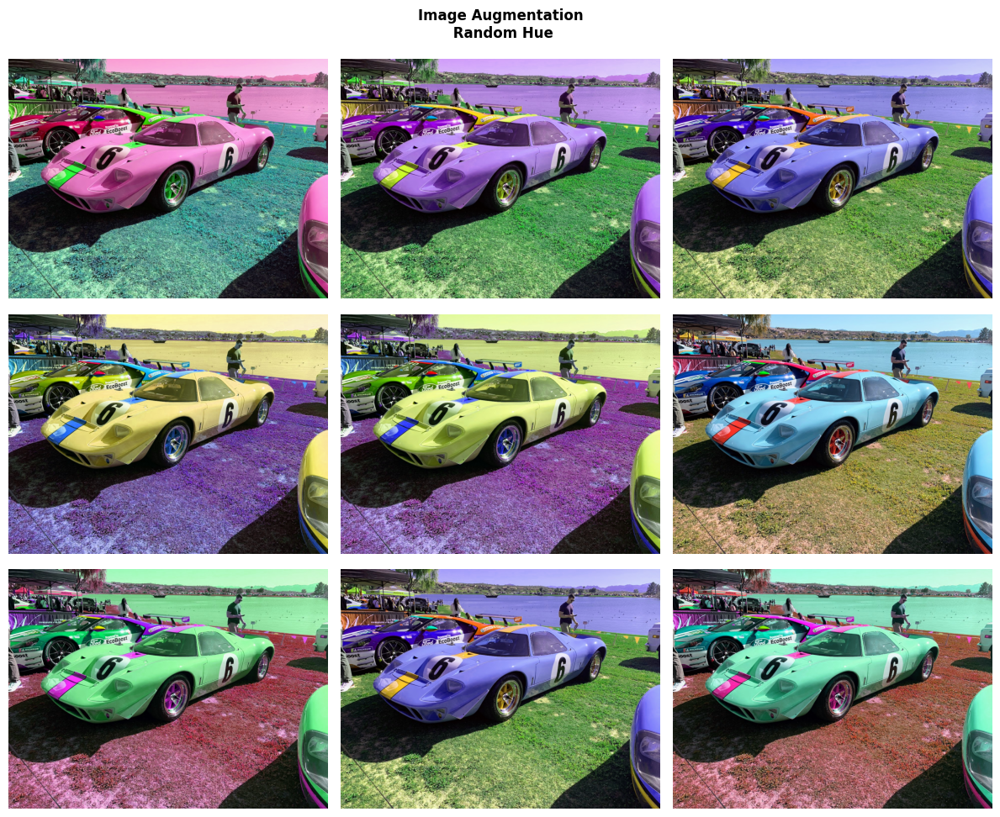

In [14]:
fig, axs = plt.subplots(nrows = 3, ncols = 3, figsize=(12,10))
for i, ax in enumerate(axs.flat):    
    augmented_img = tf.image.random_hue(batch_image[0], 0.5).numpy()
    ax.imshow(augmented_img.astype('uint8'))
    ax.axis('off')

plt.suptitle('Image Augmentation\n Random Hue', fontweight='bold')
fig.tight_layout()
plt.show()

<h4>Randomly Flipping and Rotation</h4>
Next, let's try randomly flipping and rotating the image by calling the <b><a href="https://www.tensorflow.org/api_docs/python/tf/keras/layers/RandomFlip">tf.keras.layers.RandomFlip()</a></b> and <a href="https://www.tensorflow.org/api_docs/python/tf/keras/layers/RandomRotation"><b>tf.keras.layers.RandomRotation()</b></a></b> layers within a <a href="https://www.tensorflow.org/api_docs/python/tf/keras/Sequential"><b>tf.keras.Sequential()</b></a> layer stacking function. <br><br> The RandomFlip takes in the following arguments:
<br>
<table align="left">
    <thead>
        <tr>
            <th colspan="2" align="left">tf.keras.layers.RandomFlip()</th>
        </tr>
        <tr>
            <th align='left'>Argument</th>
            <th align='left'>Definition</th>
        </tr>
    </thead>
    <tbody>
        <tr>
            <td>mode</td>
            <td>String indicating which flip mode to use. Can be "horizontal", "vertical", or "horizontal_and_vertical". Defaults to "horizontal_and_vertical". "horizontal" is a left-right flip and "vertical" is a top-bottom flip</td>
        </tr>
        <tr>
            <td>seed</td>
            <td>An integer used for reproducibility in how the image random_brightness is applied</td>
        </tr>
    </tbody>
</table>
<br>
<br>
The RandomRotation takes in the following arguments:
<table align="left">
    <thead>
        <tr>
            <th colspan="2" align="left">tf.keras.layers.RandomFlip()</th>
        </tr>
        <tr>
            <th align='left'>Argument</th>
            <th align='left'>Definition</th>
        </tr>
    </thead>
    <tbody>
        <tr>
            <td>factor</td>
            <td>a float represented as fraction of 2 Pi, or a tuple of size 2 representing lower and upper bound for rotating clockwise and counter-clockwise. A positive values means rotating counter clock-wise, while a negative value means clock-wise. When represented as a single float, this value is used for both the upper and lower bound. For instance, factor=(-0.2, 0.3) results in an output rotation by a random amount in the range [-20% * 2pi, 30% * 2pi]. factor=0.2 results in an output rotating by a random amount in the range [-20% * 2pi, 20% * 2pi].</td>
        </tr>
        <tr>
            <td>fill_mode</td>
            <td>Points outside the boundaries of the input are filled according to the given mode (one of {"constant", "reflect", "wrap", "nearest"}).</td>
        </tr>
        <tr>
            <td>interpolation</td>
            <td>Interpolation mode. Supported values: "nearest", "bilinear".
</td>
        </tr>       
        <tr>
            <td>fill_value</td>
            <td>a float represents the value to be filled outside the boundaries when fill_mode="constant".</td>
        </tr>  
        <tr>
            <td>seed</td>
            <td>Integer. Used to create a random seed.</td>
        </tr>          
    </tbody>
</table>

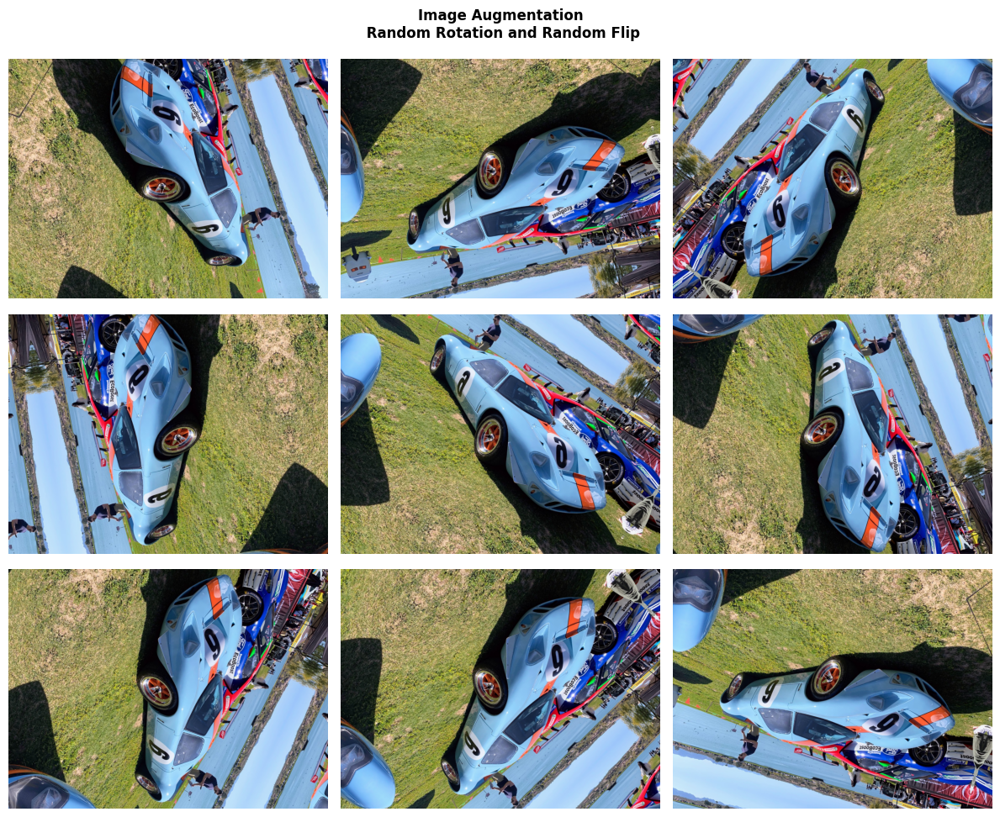

In [15]:
# build RandomFlip and RandomRotation Layers
randomFlip_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.25)
])

fig, axs = plt.subplots(nrows = 3, ncols = 3, figsize=(12,10))
for i, ax in enumerate(axs.flat):
    augmented_img = randomFlip_augmentation(batch_image)[0].numpy()
    ax.imshow(augmented_img.astype('uint8'))
    ax.axis('off')

plt.suptitle('Image Augmentation\n Random Rotation and Random Flip', fontweight='bold')
fig.tight_layout()
plt.show()

<h4>Adjusting the Saturation</h4>
Next, let's try randomly adjusting the saturation of the image by calling the <b><a href="https://www.tensorflow.org/api_docs/python/tf/image/random_saturation">tf.image.random_saturation()</a></b> function. This function takes in the following arguments:
<br>
<table align="left">
    <thead>
        <tr>
            <th colspan="2" align="left">tf.image.random_saturation</th>
        </tr>
        <tr>
            <th align='left'>Argument</th>
            <th align='left'>Definition</th>
        </tr>
    </thead>
    <tbody>
        <tr>
            <td>image</td>
            <td>RGB image or images. The size of the last dimension must be 3.</td>
        </tr>
        <tr>
            <td>lower</td>
            <td>Lower bound for the random saturation factor.</td>
        </tr>
        <tr>
            <td>upper</td>
            <td>Upper bound for the random saturation factor.</td>
        </tr>        
        <tr>
            <td>seed</td>
            <td>An integer used for reproducibility in how the image random_brightness is applied</td>
        </tr>
    </tbody>
</table>


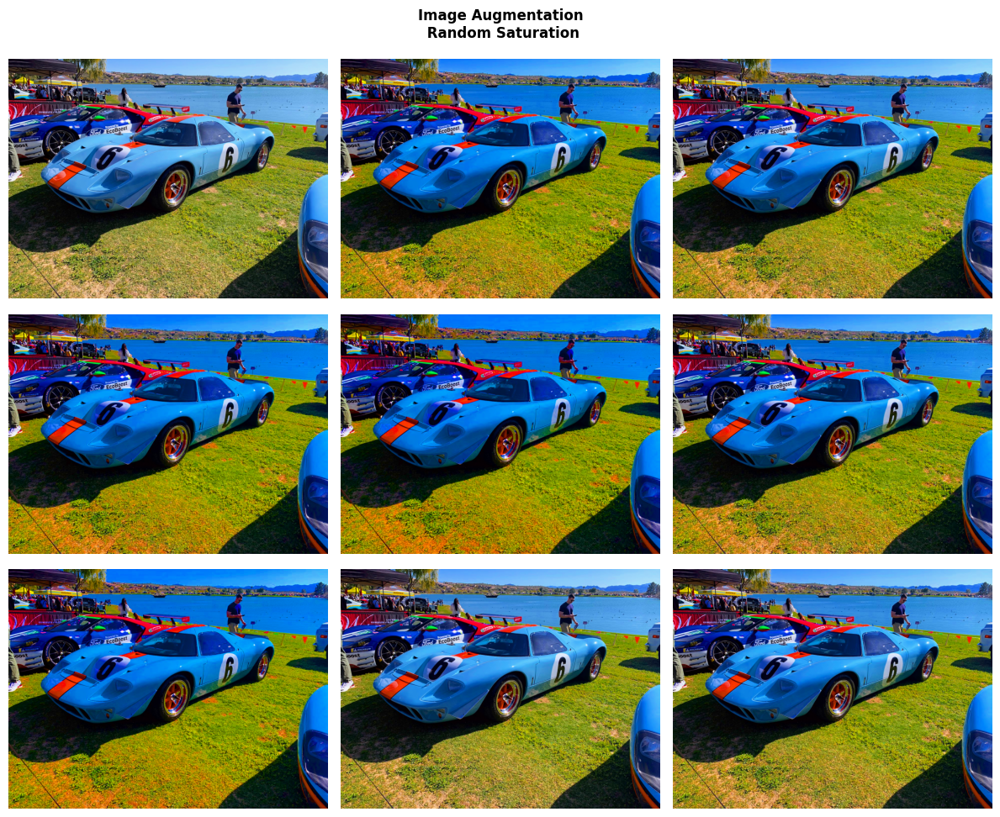

In [16]:
fig, axs = plt.subplots(nrows = 3, ncols = 3, figsize=(12,10))
for i, ax in enumerate(axs.flat):    
    augmented_img = tf.image.random_saturation(batch_image[0], 1, 5).numpy()
    ax.imshow(augmented_img.astype('uint8'))
    ax.axis('off')

plt.suptitle('Image Augmentation\n Random Saturation', fontweight='bold')
fig.tight_layout()
plt.show()

<h2>Building a Deep Learning Model</h2>
Next, let's try training a neural network that can accurately classify the images in our CIFAR-10 dataset. To build the model, we can use the VGG16 convolutional neural network architecture, and use transfer learning to take advantage of the model's pre-trained and optimized weights. We can also use a distributed training job in TensorFlow to speed up the training process.
<br>
<br>
<b>Purpose:</b>
<br>
<ul>
    <li>Modify the existing VGG16 model for transfer learning</li>
    <li>Train the model on the CIFAR-10 dataset</li>
</ul>
<details>
    <summary>
        <strong>Additional Details</strong>
    </summary>
    <ul>
        <li><b>Why Use Transfer Learning?</b><br> Transfer learning is a machine learning technique that involves using a pre-trained model as a starting point for a new problem instead of training a new model from scratch. Pre-trained models have already learned a rich set of features from millions of images, which can be reused to help improve the performance of the model on the new dataset. This is especially helpful for small datasets like CIFAR-10, which contain only 60,000 images, as training a deep learning model from scratch on such a small dataset can result in overfitting and poor performance. Transfer learning can also save computational resources and time as it eliminates the need to train the model from scratch. Therefore, using transfer learning can lead to better accuracy, faster training times, and more efficient use of resources for training deep learning models on the CIFAR-10 dataset.
        </li><br>
        <li><b>How can I utilize GPUs to speed up training?</b><br> With the help of TensorFlow's <a href="https://www.tensorflow.org/api_docs/python/tf/distribute/MirroredStrategy">MirroredStrategy()</a> function, I can distribute model training across all available GPUs to speed up the training process. If no GPUs are found, it will use the available CPUs. Note that TensorFlow treats all CPUs on a machine as a single device, and uses threads internally for parallelism. 
    </ul>
</details>
    


<h4>Modifying the VGG16 model</h4>
Next, I'll utilize transfer learning to train our CIFAR-10 train and validation datasets via a pre-trained model as the starting point, rather than training an entire convolutional neural network from scratch. This way, we can speed up the training job, and also likely prevent issues with overfitting the model. <br><br>
We can also utilize all available GPUs in the MirroredStrategy() object to distirbute the training job evenly. The code below uses the VGG16 base model architecture, and then adds  a few new classifiers to adapt the model for training on CIFAR-10.<br><br> Given that the size of the dataset is smaller, we only train using 5 epochs and we can still achieve a reasonable level of accuracy.

In [60]:
EPOCHS = 5
IMG_SIZE = (224, 224)

# Create a MirroredStrategy object to distribute the training across all available GPUs
strategy = tf.distribute.MirroredStrategy()

# Use the strategy's scope to define and compile the model
with strategy.scope():
    train_dataset = train_dataset.map(lambda image, label: (tf.image.resize(image, IMG_SIZE), label))
    validation_dataset = validation_dataset.map(lambda image, label: (tf.image.resize(image, IMG_SIZE), label))

    # Create base model
    VGG16 = tf.keras.applications.vgg16.VGG16(
        include_top=False,
        weights='imagenet',
        input_shape=(224,224,3)
    )

    # Freeze the layers of the pre-trained model
    for layer in VGG16.layers:
        layer.trainable = False

    # Add new classifier layers on top of the pre-trained model
    x = tf.keras.layers.Flatten()(VGG16.output)
    x = tf.keras.layers.Dense(4096, activation='relu')(x)
    x = tf.keras.layers.Dense(4096, activation='relu')(x)
    predictions = tf.keras.layers.Dense(NUM_CLASSES, activation='softmax')(x)
    model = tf.keras.Model(inputs=VGG16.input, outputs=predictions, name='VGG19_Transfer_Learning_CIFAR_10')
    model.compile(
        optimizer=tf.keras.optimizers.Adam(1e-4),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy'],
    )

    history = model.fit(
        train_dataset,
        epochs=EPOCHS,
        validation_data=validation_dataset,
        verbose=1,
    )    

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
Epoch 1/5


2023-04-08 10:29:37.110536: W tensorflow/core/grappler/optimizers/data/auto_shard.cc:776] AUTO sharding policy will apply DATA sharding policy as it failed to apply FILE sharding policy because of the following reason: Found an unshardable source dataset: name: "TensorSliceDataset/_2"
op: "TensorSliceDataset"
input: "Placeholder/_0"
input: "Placeholder/_1"
attr {
  key: "Toutput_types"
  value {
    list {
      type: DT_UINT8
      type: DT_INT64
    }
  }
}
attr {
  key: "_cardinality"
  value {
    i: 40000
  }
}
attr {
  key: "is_files"
  value {
    b: false
  }
}
attr {
  key: "metadata"
  value {
    s: "\n\025TensorSliceDataset:66"
  }
}
attr {
  key: "output_shapes"
  value {
    list {
      shape {
        dim {
          size: 32
        }
        dim {
          size: 32
        }
        dim {
          size: 3
        }
      }
      shape {
      }
    }
  }
}
experimental_type {
  type_id: TFT_PRODUCT
  args {
    type_id: TFT_DATASET
    args {
      type_id: TFT_PROD

2500/2500 [==============================] - ETA: 0s - loss: 1.1111 - accuracy: 0.7111

2023-04-08 10:33:56.366555: W tensorflow/core/grappler/optimizers/data/auto_shard.cc:776] AUTO sharding policy will apply DATA sharding policy as it failed to apply FILE sharding policy because of the following reason: Found an unshardable source dataset: name: "TensorSliceDataset/_2"
op: "TensorSliceDataset"
input: "Placeholder/_0"
input: "Placeholder/_1"
attr {
  key: "Toutput_types"
  value {
    list {
      type: DT_UINT8
      type: DT_INT64
    }
  }
}
attr {
  key: "_cardinality"
  value {
    i: 10000
  }
}
attr {
  key: "is_files"
  value {
    b: false
  }
}
attr {
  key: "metadata"
  value {
    s: "\n\025TensorSliceDataset:68"
  }
}
attr {
  key: "output_shapes"
  value {
    list {
      shape {
        dim {
          size: 32
        }
        dim {
          size: 32
        }
        dim {
          size: 3
        }
      }
      shape {
      }
    }
  }
}
experimental_type {
  type_id: TFT_PRODUCT
  args {
    type_id: TFT_DATASET
    args {
      type_id: TFT_PROD

2500/2500 [==============================] - 311s 123ms/step - loss: 1.1111 - accuracy: 0.7111 - val_loss: 0.6451 - val_accuracy: 0.7892
Epoch 2/5
2500/2500 [==============================] - 309s 123ms/step - loss: 0.2660 - accuracy: 0.9104 - val_loss: 0.8218 - val_accuracy: 0.7896
Epoch 3/5
2500/2500 [==============================] - 308s 123ms/step - loss: 0.1882 - accuracy: 0.9409 - val_loss: 1.1540 - val_accuracy: 0.7721
Epoch 4/5
2500/2500 [==============================] - 308s 123ms/step - loss: 0.1422 - accuracy: 0.9564 - val_loss: 1.1105 - val_accuracy: 0.7871
Epoch 5/5
2500/2500 [==============================] - 308s 123ms/step - loss: 0.1167 - accuracy: 0.9652 - val_loss: 1.0813 - val_accuracy: 0.7961


<h4>Understanding our Model Structure</h4>
Next, let's call the model.summary() to understand the detailed view of the CNN. We can quickly see additional model layers added on top of the base VGG16, starting with the flatten_7 layer, and then two intermediate ReLU layers, followed by a dense layer to get to our 10 classes. Below, we can also see that a huge portion of the initial set of parameters aren't trainable, and that the primary set of trainable layers are only from the bottom four layers we added to the baseline VGG16 architecture. Below are some additional details regarding the layer types shown below:<br><br>

<details>
    <summary>
        <strong>Additional Details</strong>
    </summary>
<table align="left">
    <thead>
            <tr>
            <th align='left'>Layer Type</th>
            <th align='left'>Definition</th>
        </tr>
    </thead>
    <tbody>
        <tr>
            <td>InputLayer</td>
            <td> The InputLayer serves as the entry point of the model where the input data is fed to the model for processing. It is the first layer in the model and defines the shape of the input data that the model expects.</td>
        </tr>
        <tr>
            <td>Conv2D
            <td>The Conv2D layer is used to extract features from the input image by applying a set of filters to the image, and it learns these filters during the training process. The Conv2D layer helps in reducing the dimensionality of the input image while retaining the relevant information needed for classification. In Conv2D, a set of filters is applied to the input image to extract features, and these features are learned during the training process. The output of a Conv2D layer is a feature map, where each neuron represents a learned feature./td>
        </tr>
        <tr>
            <td>MaxPooling2D</td>
            <td>The MaxPooling2D layer reduces the dimensionality of the feature maps by taking the maximum value within a given window. The MaxPooling layer helps in reducing the computational complexity of the model, making it more efficient. It also helps in preventing overfitting by reducing the number of parameters and avoiding redundancy in the feature maps. MaxPooling takes the maximum value within a given window to downsample the output of the Conv2D layer. </td>
        </tr>
        <tr>
            <td>Flatten</td>
            <td>The Flatten layer takes the 2D feature map and flattens it into a 1D vector, which can then be passed to the fully connected layers of the network. This layer helps in reducing the dimensionality of the output of the convolutional and pooling layers, making it suitable for the fully connected layers. It is also useful in reducing the number of parameters in the model, making it more efficient.</td>
        </tr>
        <tr>
            <td>Dense</td>
            <td>The Dense layer is typically added after the Flatten layer in a CNN. This layer performs a linear operation on the input data and applies an activation function, allowing the network to learn non-linear patterns in the data. The Dense layer is commonly used for classification tasks, where the output of the layer represents the probability of each class. It is also useful in reducing the dimensionality of the input data, making it suitable for the output layer.</td>
        </tr>
    </tbody>
</table>
</details>
    


In [61]:
# Plot model summary
model.summary()

Model: "VGG19_Transfer_Learning_CIFAR_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_13 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None

<h4>Visualize the training job</h4>
After saving our model training history, let's go ahead and plot the training and validation accuracies we see in the model. While the training accuracy increases to 95%, the validation accuracy seems to hover around 80%. This likely means that the model is too complex and is fitting the data too closely.<br><br> To avoid this, we can try several strategies including regularization, dropout, or even tunign hyperparameters like the learning rate.  

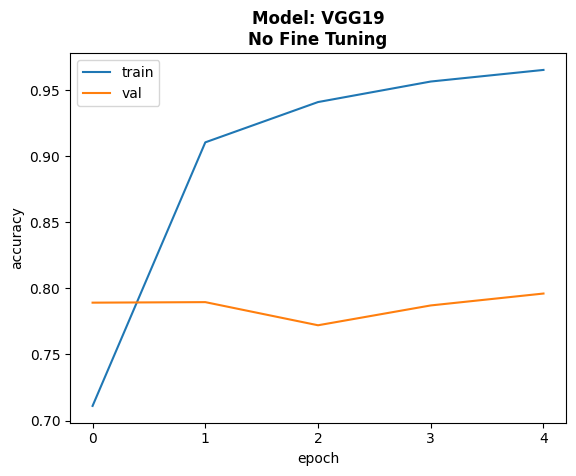

INFO:tensorflow:Assets written to: outputs/vgg19_base/model/assets


In [62]:
# Save Training History
pd.DataFrame(history.history).to_csv('outputs/vgg19_base/history.csv', index=False)

# Save Plot
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model: VGG19\nNo Fine Tuning', fontweight='bold')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.xticks(np.arange(0,5,1))
plt.legend(['train', 'val'], loc='upper left')
plt.savefig('plots/vgg19_base.jpg')
plt.show()

# Save Model
model.save('outputs/vgg19_base/model')

<h2>Evaluating the Model Performance</h2>
Now that we trained a model, and had a high-level look at the model performance, let's try some inference testing on the test dataset to see how the model performs on a dataset it hasn't used for training. This will give us a sense of whether the model performs well in new data, and whether we'd be confident enough to use in training.
<br>
<br>
<b>Purpose:</b>
<br>
<ul>
    <li>Modify the existing VGG16 model for transfer learning</li>
    <li>Train the model on the CIFAR-10 dataset</li>
</ul>

In [4]:
# Load the trained model
model = tf.keras.models.load_model('outputs/vgg19_base/model')

# Resizse the CIFAR-10 test dataset from 30x30x3 to 224x224x3
IMG_SIZE = (224,224)
test_dataset = test_dataset.map(lambda image, label: (tf.image.resize(image, IMG_SIZE), label))

Here, we can get several things related to the model's performance in a test dataset. We can get the raw predictions when calling model.predict(), and this will give us a list of 10 values per image, that'll represent the prediction probabilities that a given predition belongs to one of the classes.<br><br>
Then, we can use the np.argmax() function to extract the index of the largest value (i.e., the value representing the most confident prediction) to see what our model is predicted. This is what we'll compare to our labels dataset, to see how the model does in compared to the grond truth.<br><br>
In many cases, a production-level classification problem will have requirements to only utilize predictions that we're highly confident in. To filter this, we can see the highest-prediction probability for each image, which is the model's way of telling us how confident it is in a given prediction. 

In [5]:
predictions = model.predict(test_dataset, verbose=1)
predictions_argmax = [np.argmax(i) for i in predictions]
labels_dataset = test_dataset.map(lambda x, y: y)
class_labels = np.concatenate([i.numpy() for i in labels_dataset])
predict_probas = [max(i) for i in predictions]

2023-04-09 20:55:01.267758: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8200


625/625 [==============================] - 55s 81ms/step


Now that we have the predictions and the original labels from our test dataset, we can evaluate the model performance by using a threshold of 70%. We can see the percent of predictions retained (91%), and the performance via precision, recall, and F1-score for each of the 10 classes in the CIFAR-10 dataset. 

In looking below, we can see our model performs generally well with 84% accuracy, while retaining 91% of the predictions with a threshold of 70% confidence. The confusion matrix below gives some detail as to when we're seeing misclassifications amongst the different classes. A common occurence here, looks like we're misclassifying dogs and cats (and vice-versa), since visually they're very similar in the dataset. This makes it harder for our trained model to undersatnd the differences between these two classes.

Classification Report for 0.7:
Predictions Retained: 91.0
              precision    recall  f1-score   support

    airplane       0.86      0.91      0.88       952
  automobile       0.93      0.90      0.91       967
        bird       0.84      0.80      0.82       887
         cat       0.62      0.76      0.68       880
        deer       0.79      0.81      0.80       865
         dog       0.70      0.76      0.73       903
        frog       0.95      0.80      0.87       884
       horse       0.95      0.79      0.86       890
        ship       0.89      0.92      0.91       964
       truck       0.93      0.90      0.91       950

    accuracy                           0.84      9142
   macro avg       0.85      0.83      0.84      9142
weighted avg       0.85      0.84      0.84      9142

Confusion Matrix:


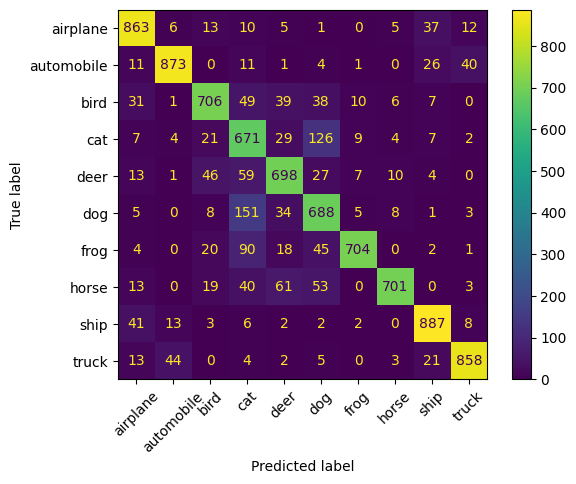

In [7]:
proba_classification_report(predictions_argmax, class_labels, predict_probas, 0.70, list(class_dict.values()))

Running through the same logic, here we can see the model performance when we using a confidence threshold of 99%. In this situation, we retain 67% of the data; however, we can improve our accuracy to 92%. In these situations, it's important to understand the tradeoffs between model performance in specific classes, and the percent of predictions retained. 

Classification Report for 0.99:
Predictions Retained: 67.0
              precision    recall  f1-score   support

    airplane       0.92      0.95      0.93       796
  automobile       0.96      0.95      0.95       829
        bird       0.94      0.89      0.92       627
         cat       0.78      0.88      0.83       510
        deer       0.90      0.92      0.91       543
         dog       0.83      0.87      0.85       550
        frog       0.98      0.92      0.95       580
       horse       0.98      0.90      0.93       641
        ship       0.94      0.96      0.95       838
       truck       0.96      0.95      0.95       797

    accuracy                           0.92      6711
   macro avg       0.92      0.92      0.92      6711
weighted avg       0.93      0.92      0.92      6711

Confusion Matrix:


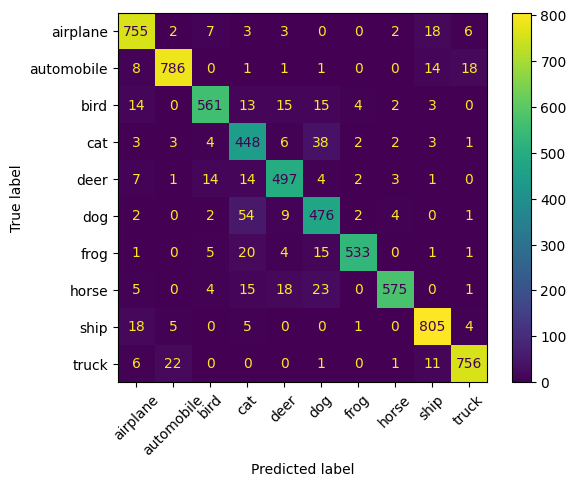

In [8]:
proba_classification_report(predictions_argmax, class_labels, predict_probas, 0.99, list(class_dict.values()))

<h4>Conclusion</h4>

At this point, we've been able to import a dataset (CIFAR-10) of raw images, interpret the features of this dataset (class frequency, image quality, etc.) and train an image classification model via transfer learning on this dataset as well. In addition, we've been able to take an example image, and perform various data augmentation steps to the original image, which aligns with how we potentially would need to pre-process individual images in a dataset for training in a future example.

For future learning, here are a few additional steps that are important to consider in the model training process for future scenarios:

<ul>

<li>Saving TensorFlow models: Do I save weights, or do I save model files? What model file format do I use?</li>

<li>How do I know what type of compute resources I'd need for training my image dataset?</li>

<li>How do I work towards productionalizing my model in Google Cloud Platform?</li>

<li>How do I work towards porductionalizing my model in Microsoft Azure?</li>

<h4>Additional Resources</h4>

Listed below are a few additional resources that may be helpful for future applications of this work:

<ul>

<li><a href="https://cs231n.github.io/">Stanford CS231n: Convolutional Neural Networks for Visual Recognition</a>: This is a commonly referenced resource that talks about various steps in computer vision-related tasks (including transfer learning).</li>

<li><a href="https://developers.google.com/machine-learning/practica/image-classification#:~:text=Image%20classification%20is%20a%20supervised,the%20input%20to%20the%20model.">ML Practicum: Image Classification: </a>This is another source that discusses how to build an image classification model, but in the context of how Google built their models for Google Photos. It's a solid crash course on convolutional neural networks, and has an additional tutorial to distinguish different types of images</li>

<li><a href="https://www.tensorflow.org/tutorials/images/classification">TensorFlow Image Classification Tutorial: </a>Here's another tutorial from TensorFlow that shows how to classify a set of photos using TensorFlow-specific functions</li>